## **Power Plant Optimization Using Data-Driven Models**
### **Project Summary**  
  **Overview**  
  Coal-fired power plants are key to electricity generation but face challenges like fuel inefficiency, emissions, and manual control limitations. With the rise of data from SCADA systems, there's potential to optimize operations using machine learning. 
**Coal Power Plant Schematic**


  **Problem**  
Manual, heuristic-based operations lead to:  
- High coal consumption  
- Suboptimal power output  
- Emission regulation issues  
- Underused SCADA data

**Objective**  
Build a data-driven framework to:  
- Clean and analyze plant data  
- Predict power output using models (Random Forest, LSTM)  
- Identify key influencing factors  
- Optimize parameters using Genetic Algorithms or PSO  
- Improve fuel efficiency and emissions  
- Provide actionable, SCADA-integrated recommendations

**Literature Insights**  
- Traditional controls are limited in handling complex dynamics  
- ML models (Random Forest, Gradient Boosting, LSTM) show strong prediction performance  
- Optimization algorithms (GA, PSO) effectively balance power and emissions  
- Real-world use: Siemens, DeepMind, GE have applied similar techniques

**Methodology**  
- Collect SCADA data  
- Preprocess and engineer features (e.g., air-fuel ratio)  
- Train ML models to predict output  
- Use optimization algorithms to find best operating points  
- Validate improvements on test data
"""



Let's start importing the datset and exploring it 

In [2]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
get_ipython().run_line_magic('matplotlib', 'inline')
import warnings
warnings.filterwarnings("ignore")



### **ABOUT DATA**  
### **Dataset Parameters**  
The dataset includes **110+ columns** from a thermal power plant’s operational logs. Key parameters:  
1. **Output Variable**:  
   - `GENERATOR MW`: Electrical power output (target variable).  
2. **Input Variables**:  
   - **Fuel & Combustion**: `TOTAL COAL FLOW`, `HFO/LDO BNR DMPR POS` (fuel damper positions).  
   - **Airflow**: `TOTAL AIR FLOW`, `FURNACE DRAFT PRESS`.  
   - **Steam Cycle**: `MS LINE TEMP`, `1RY SH DSH FW FLOW`.  
   - **Burner Control**: `[1-8]CORNER BURNER TILTING DRIVE`, `AA (L) CRNR DMPR`.  
   - **Environmental**: `SH ECO O/L FLUE GAS DMPR` (emissions control).  



### **What is a Power Plant & How Does It Work?**  
### **Definition**  
A power plant converts **primary energy** (coal, gas, nuclear) into **electrical energy**.  

### **Working Process (Coal-Fired)**:  
1. **Combustion**: Coal is pulverized and burned in a furnace, producing heat.  
2. **Steam Generation**: Heat converts water into high-pressure steam in boilers.  
3. **Turbine Rotation**: Steam spins turbines connected to generators.  
4. **Power Generation**: Generators convert mechanical energy to electricity via electromagnetic induction.  
5. **Condensation**: Steam is cooled back to water in condensers for reuse.  



### **Uses in Industries**  
Power plants are critical for:  
1. **Electricity Supply**: Manufacturing, steel mills, data centers.  
2. **Combined Heat and Power (CHP)**: Simultaneous electricity and steam production for industries like paper, chemicals.  
3. **Grid Stability**: Baseload and peaking plants ensure uninterrupted supply.  





In [34]:
df = pd.read_csv('Boiler Process Optimization.csv')
df

,GENERATOR MW,TOTAL COAL FLOW BEF CAL CORR,TOTAL AIR FLOW(t/h),FURNACE DRAFT PRESS,AA (L) CRNR 1 AA DMPR FB,AA (L) CRNR 2 AA DMPR FB,AA (L) CRNR 3 AA DMPR FB,AA (L) CRNR 4 AA DMPR FB,AA (L) CRNR 5 AA DMPR FB,AA (L) CRNR 6 AA DMPR FB,...,2RY SH B O/L TEMP,3RY SH A I/L TEMP,3RY SH B I/L TEMP,1RY RHTR O/L TEMP 1,1RY RHTR O/L TEMP 2,2RY RH-A I/L STM TEMP,2RY RH-B I/L STM TEMP,2RY RH-A O/L TEMP,2RY RH-B O/L TEMP,RH DSH FW FLOW
0,690.6,356.0,2361.1,-9.20,55.8,50.8,47.6,47.3,39.3,49.9,...,552.4,537.4,535.7,498.5,502.9,497.6,496.7,597.4,594.5,0
1,691.0,355.9,2357.4,-8.46,55.8,50.9,47.6,47.3,39.3,49.9,...,552.4,537.3,535.7,498.3,502.7,497.5,496.6,597.4,594.3,0
2,690.8,355.8,2359.6,-10.49,55.8,50.9,47.6,47.3,39.3,49.9,...,552.9,537.1,535.9,498.5,502.6,497.5,496.6,597.5,594.3,0
3,690.7,355.5,2358.5,-11.05,55.8,50.9,47.6,47.3,39.3,49.9,...,553.4,536.5,536.5,498.5,502.6,497.7,496.6,597.5,594.3,0
4,690.8,355.3,2355.9,-9.57,55.8,50.9,47.5,47.3,39.3,49.9,...,553.8,536.3,536.9,498.6,502.6,497.6,496.6,597.5,594.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17275,688.5,346.8,2354.4,-8.48,54.8,46.9,57.0,56.3,51.2,66.4,...,559.1,539.4,540.9,504.2,506.4,503.1,499.8,601.4,597.1,0
17276,688.0,347.0,2361.8,-10.02,54.9,46.9,57.0,56.2,51.3,66.4,...,559.0,539.0,541.2,504.1,506.5,503.2,499.8,601.3,597.2,0
17277,688.0,347.1,2361.5,-10.92,54.9,47.0,57.0,56.3,51.3,66.4,...,559.3,538.7,541.6,504.0,506.4,502.9,499.9,601.1,597.3,0
17278,688.0,347.4,2366.0,-10.91,54.8,46.9,57.0,56.4,51.3,66.4,...,559.5,538.2,542.1,504.0,506.7,503.1,499.8,601.2,597.1,0


In [35]:
print(df.columns.tolist())  # TO Shows all column names


['GENERATOR MW', 'TOTAL COAL FLOW BEF CAL CORR', 'TOTAL AIR FLOW(t/h)', 'FURNACE DRAFT PRESS', 'AA (L) CRNR 1 AA DMPR  FB', 'AA (L) CRNR 2 AA DMPR  FB', 'AA (L) CRNR 3 AA DMPR FB', 'AA (L) CRNR 4 AA DMPR FB', 'AA (L) CRNR 5 AA DMPR FB', 'AA (L) CRNR 6 AA DMPR FB', 'AA (L) CRNR 7 AA DMPR FB', 'AA (L) CRNR 8 AA DMPR FB', 'WTR FUEL RATIO', '1RY SH DSH FW FLOW', '2RY SH DSH FW FLOW', 'RH ECO O/L FLUE GAS DMPR', 'SH ECO O/L FLUE GAS DMPR ', 'WIND BOX and FURNACE DP 1', 'WIND BOX and FURNACE DP 2', '1CORNER BURNER TILTING DRIVE  FB(deg)', '2CORNER BURNER TILTING DRIVE FB(deg)', '3CORNER BURNER TILTING DRIVE FB(deg)', '4CORNER BURNER TILTING DRIVE FB(deg)', '5CORNER BURNER TILTING DRIVE FB(deg)', '6CORNER BURNER TILTING DRIVE FB(deg)', '7CORNER BURNER TILTING DRIVE FB(deg)', '8CORNER BURNER TILTING DRIVE FB(deg)', 'MS LINE A TEMP', 'MS LINE B TEMP', 'WW O/L RHT TEMP', 'WW O/L LFT TEMP', 'COAL BNR A CRNR 1 CNTRL DMPR POS', 'COAL BNR A CRNR 1 CNTRL DMPR POS.1', 'COAL BNR A CRNR 1 CNTRL DMPR POS

In [36]:
df_copy = df.copy()

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17280 entries, 0 to 17279
Columns: 116 entries, GENERATOR MW to RH DSH FW FLOW
dtypes: float64(113), int64(3)
memory usage: 15.3 MB


In [38]:
df.describe()

,GENERATOR MW,TOTAL COAL FLOW BEF CAL CORR,TOTAL AIR FLOW(t/h),FURNACE DRAFT PRESS,AA (L) CRNR 1 AA DMPR FB,AA (L) CRNR 2 AA DMPR FB,AA (L) CRNR 3 AA DMPR FB,AA (L) CRNR 4 AA DMPR FB,AA (L) CRNR 5 AA DMPR FB,AA (L) CRNR 6 AA DMPR FB,...,2RY SH B O/L TEMP,3RY SH A I/L TEMP,3RY SH B I/L TEMP,1RY RHTR O/L TEMP 1,1RY RHTR O/L TEMP 2,2RY RH-A I/L STM TEMP,2RY RH-B I/L STM TEMP,2RY RH-A O/L TEMP,2RY RH-B O/L TEMP,RH DSH FW FLOW
count,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,...,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000,17280.000000
mean,687.993235,346.539988,2375.491505,-10.038014,58.479705,56.046238,51.865648,52.207992,46.932969,57.698194,...,554.011516,537.625556,536.475937,501.440903,506.942552,500.231377,500.153872,596.039433,596.072245,0.025405
std,5.151300,10.951563,28.059112,1.182714,6.557772,7.240884,2.535248,4.480486,6.920929,4.068884,...,5.202913,3.211057,2.106180,3.037235,3.013657,3.220014,2.959221,2.222460,2.073656,0.157357
min,619.400000,285.300000,2131.300000,-27.500000,51.100000,46.900000,47.300000,47.300000,37.500000,49.900000,...,533.200000,521.800000,526.500000,492.800000,497.600000,480.300000,489.000000,589.300000,586.600000,0.000000
25%,687.700000,339.300000,2360.300000,-10.790000,52.700000,50.000000,51.600000,48.300000,39.300000,58.500000,...,551.000000,535.700000,535.100000,499.200000,505.200000,498.100000,498.600000,594.500000,594.800000,0.000000
50%,688.500000,345.600000,2373.000000,-10.030000,54.900000,50.300000,52.400000,48.400000,44.800000,58.700000,...,553.900000,537.700000,536.500000,501.700000,507.200000,500.600000,500.400000,596.000000,596.300000,0.000000
75%,689.200000,354.000000,2389.600000,-9.280000,65.300000,60.700000,52.800000,57.000000,53.300000,59.000000,...,556.900000,539.700000,537.700000,503.800000,509.300000,502.600000,502.500000,597.500000,597.500000,0.000000
max,713.300000,397.800000,2523.200000,-3.830000,73.700000,69.100000,57.600000,57.100000,58.700000,66.400000,...,590.900000,558.700000,546.800000,514.600000,519.100000,509.000000,508.000000,605.500000,602.500000,1.000000


We see here that mean and 50%,75% are nearer and we can observe the data is well structured 
Now lets find any missing and 'nan' Values

In [39]:
df.isnull().sum()


GENERATOR MW                    0
TOTAL COAL FLOW BEF CAL CORR    0
TOTAL AIR FLOW(t/h)             0
FURNACE DRAFT PRESS             0
AA (L) CRNR 1 AA DMPR  FB       0
                               ..
2RY RH-A I/L STM TEMP           0
2RY RH-B I/L STM TEMP           0
2RY RH-A O/L TEMP               0
2RY RH-B O/L TEMP               0
RH DSH FW FLOW                  0
Length: 116, dtype: int64

So there is no nan values and missing values  in dataset that's huge plus 

In [40]:
df.sum()

GENERATOR MW                    11888523.10
TOTAL COAL FLOW BEF CAL CORR     5988211.00
TOTAL AIR FLOW(t/h)             41048493.20
FURNACE DRAFT PRESS              -173456.89
AA (L) CRNR 1 AA DMPR  FB        1010529.30
                                   ...     
2RY RH-A I/L STM TEMP            8643998.20
2RY RH-B I/L STM TEMP            8642658.90
2RY RH-A O/L TEMP               10299561.40
2RY RH-B O/L TEMP               10300128.40
RH DSH FW FLOW                       439.00
Length: 116, dtype: float64

In [41]:
fig = px.histogram(df,x='GENERATOR MW',marginal='box',nbins = 100,title='Distrubtion of GENERATOR MW')
fig.update_layout(bargap=0.2)
fig.show()

We can observe that there are bunch of outliers and max values are in between 680-700

In [42]:
fig = px.histogram(df,x='TOTAL COAL FLOW BEF CAL CORR',marginal='box',nbins = 100,title='Distrubtion of TOTAL COAL FLOW BEF CAL CORR')
fig.update_layout(bargap=0.2)
fig.show()

In [43]:
fig = px.histogram(df,x='TOTAL AIR FLOW(t/h)',marginal='box',nbins = 100,title='Distrubtion of TOTAL AIR FLOW(t/h)')
fig.update_layout(bargap=0.2)
fig.show()

Let's do some more visualiation to how generator mw is influeced by other features

In [44]:
import plotly.express as px
fig = px.scatter(df, 
                 x='GENERATOR MW', 
                 y='TOTAL COAL FLOW BEF CAL CORR', 
                 opacity=1, 
                 title='GENERATOR MW VS TOTAL COAL FLOW BEF CAL CORR', 
                 color='TOTAL COAL FLOW BEF CAL CORR',
                 color_discrete_sequence=['blue','red'])


fig.update_traces(marker=dict(size=2))


fig.update_layout(width=1200, height=700)

fig.show()


In [45]:
import plotly.express as px
fig = px.scatter(df, 
                 x='GENERATOR MW', 
                 y='TOTAL AIR FLOW(t/h)', 
                 opacity=1, 
                 title='GENERATOR MW VS TOTAL AIR FLOW(t/h)', 
                 color='TOTAL COAL FLOW BEF CAL CORR',
                 color_discrete_sequence=['blue','red'])


fig.update_traces(marker=dict(size=2))


fig.update_layout(width=1200, height=700)

fig.show()

In [46]:
df


,GENERATOR MW,TOTAL COAL FLOW BEF CAL CORR,TOTAL AIR FLOW(t/h),FURNACE DRAFT PRESS,AA (L) CRNR 1 AA DMPR FB,AA (L) CRNR 2 AA DMPR FB,AA (L) CRNR 3 AA DMPR FB,AA (L) CRNR 4 AA DMPR FB,AA (L) CRNR 5 AA DMPR FB,AA (L) CRNR 6 AA DMPR FB,...,2RY SH B O/L TEMP,3RY SH A I/L TEMP,3RY SH B I/L TEMP,1RY RHTR O/L TEMP 1,1RY RHTR O/L TEMP 2,2RY RH-A I/L STM TEMP,2RY RH-B I/L STM TEMP,2RY RH-A O/L TEMP,2RY RH-B O/L TEMP,RH DSH FW FLOW
0,690.6,356.0,2361.1,-9.20,55.8,50.8,47.6,47.3,39.3,49.9,...,552.4,537.4,535.7,498.5,502.9,497.6,496.7,597.4,594.5,0
1,691.0,355.9,2357.4,-8.46,55.8,50.9,47.6,47.3,39.3,49.9,...,552.4,537.3,535.7,498.3,502.7,497.5,496.6,597.4,594.3,0
2,690.8,355.8,2359.6,-10.49,55.8,50.9,47.6,47.3,39.3,49.9,...,552.9,537.1,535.9,498.5,502.6,497.5,496.6,597.5,594.3,0
3,690.7,355.5,2358.5,-11.05,55.8,50.9,47.6,47.3,39.3,49.9,...,553.4,536.5,536.5,498.5,502.6,497.7,496.6,597.5,594.3,0
4,690.8,355.3,2355.9,-9.57,55.8,50.9,47.5,47.3,39.3,49.9,...,553.8,536.3,536.9,498.6,502.6,497.6,496.6,597.5,594.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17275,688.5,346.8,2354.4,-8.48,54.8,46.9,57.0,56.3,51.2,66.4,...,559.1,539.4,540.9,504.2,506.4,503.1,499.8,601.4,597.1,0
17276,688.0,347.0,2361.8,-10.02,54.9,46.9,57.0,56.2,51.3,66.4,...,559.0,539.0,541.2,504.1,506.5,503.2,499.8,601.3,597.2,0
17277,688.0,347.1,2361.5,-10.92,54.9,47.0,57.0,56.3,51.3,66.4,...,559.3,538.7,541.6,504.0,506.4,502.9,499.9,601.1,597.3,0
17278,688.0,347.4,2366.0,-10.91,54.8,46.9,57.0,56.4,51.3,66.4,...,559.5,538.2,542.1,504.0,506.7,503.1,499.8,601.2,597.1,0


## DATA CLEANING 

# REGULARAZATION OF DATA

For traininig a machine learning model we need to scale the data for that we will use Robust Scaling (Best for Outliers & Negative Values)

In [47]:
import pandas as pd

# Step 1: Clip outliers using IQR method
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df_clipped = df.apply(lambda x: x.clip(lower=lower_bound[x.name], upper=upper_bound[x.name]))

# Replace original df with clipped version
df = df_clipped.copy()

In [48]:
df


,GENERATOR MW,TOTAL COAL FLOW BEF CAL CORR,TOTAL AIR FLOW(t/h),FURNACE DRAFT PRESS,AA (L) CRNR 1 AA DMPR FB,AA (L) CRNR 2 AA DMPR FB,AA (L) CRNR 3 AA DMPR FB,AA (L) CRNR 4 AA DMPR FB,AA (L) CRNR 5 AA DMPR FB,AA (L) CRNR 6 AA DMPR FB,...,2RY SH B O/L TEMP,3RY SH A I/L TEMP,3RY SH B I/L TEMP,1RY RHTR O/L TEMP 1,1RY RHTR O/L TEMP 2,2RY RH-A I/L STM TEMP,2RY RH-B I/L STM TEMP,2RY RH-A O/L TEMP,2RY RH-B O/L TEMP,RH DSH FW FLOW
0,690.6,356.0,2361.1,-9.20,55.8,50.8,49.8,47.3,39.3,57.75,...,552.4,537.4,535.7,498.5,502.9,497.6,496.7,597.4,594.5,0
1,691.0,355.9,2357.4,-8.46,55.8,50.9,49.8,47.3,39.3,57.75,...,552.4,537.3,535.7,498.3,502.7,497.5,496.6,597.4,594.3,0
2,690.8,355.8,2359.6,-10.49,55.8,50.9,49.8,47.3,39.3,57.75,...,552.9,537.1,535.9,498.5,502.6,497.5,496.6,597.5,594.3,0
3,690.7,355.5,2358.5,-11.05,55.8,50.9,49.8,47.3,39.3,57.75,...,553.4,536.5,536.5,498.5,502.6,497.7,496.6,597.5,594.3,0
4,690.8,355.3,2355.9,-9.57,55.8,50.9,49.8,47.3,39.3,57.75,...,553.8,536.3,536.9,498.6,502.6,497.6,496.6,597.5,594.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17275,688.5,346.8,2354.4,-8.48,54.8,46.9,54.6,56.3,51.2,59.75,...,559.1,539.4,540.9,504.2,506.4,503.1,499.8,601.4,597.1,0
17276,688.0,347.0,2361.8,-10.02,54.9,46.9,54.6,56.2,51.3,59.75,...,559.0,539.0,541.2,504.1,506.5,503.2,499.8,601.3,597.2,0
17277,688.0,347.1,2361.5,-10.92,54.9,47.0,54.6,56.3,51.3,59.75,...,559.3,538.7,541.6,504.0,506.4,502.9,499.9,601.1,597.3,0
17278,688.0,347.4,2366.0,-10.91,54.8,46.9,54.6,56.4,51.3,59.75,...,559.5,538.2,541.6,504.0,506.7,503.1,499.8,601.2,597.1,0


Let's save the scaler 

saving the scaler is useful when:

    - we get new/unseen data later (e.g., in deployment). we’ll need the same scaler to transform that data consistently.

    -  we train the model now but want to use the same preprocessing in the future without refitting the scaler.


In [49]:
from joblib import dump
dump(scaler, 'robust_scaler.pkl') 


['robust_scaler.pkl']

# FEATURE SELECTION

As data is scaled now we have to remove less/no afftect features for model training as they can lead to mis predction 

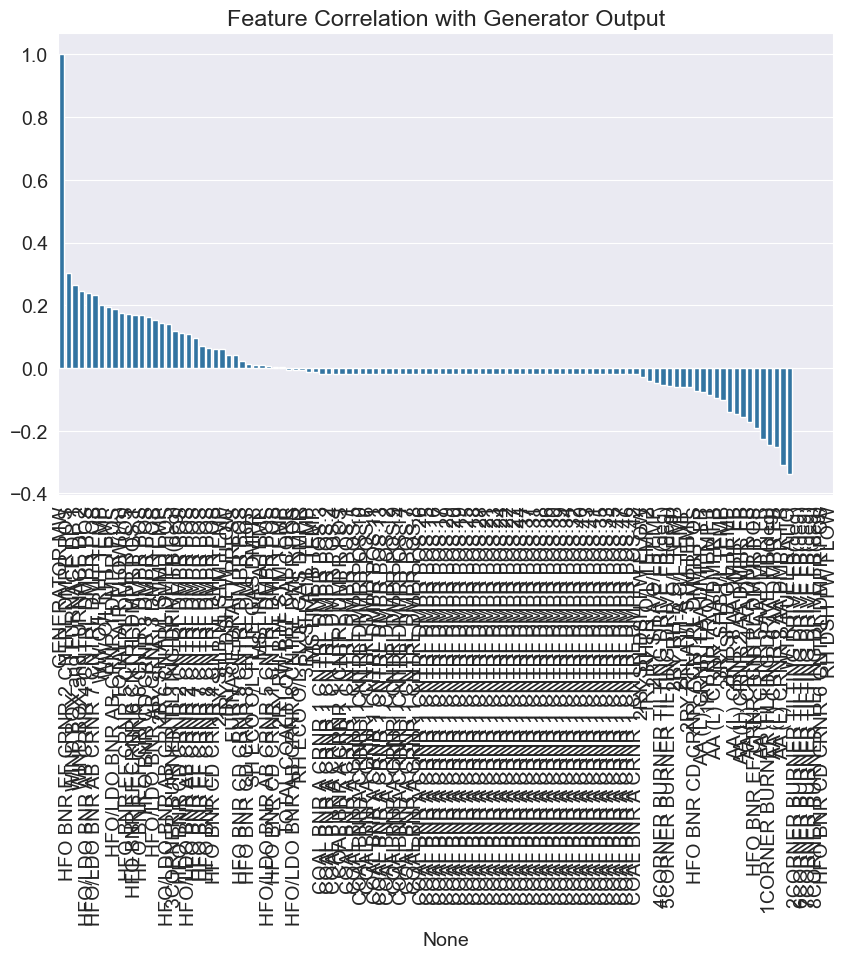

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# To Compute correlation with Generator Output
correlation = df.corr()['GENERATOR MW'].sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation.index, y=correlation.values)
plt.xticks(rotation=90)
plt.title("Feature Correlation with Generator Output")
plt.show()


As we can see there a lot of columns which does not much affect our target so we remove all the negitive ones between -0.1 to 0.1 as they have low impact 

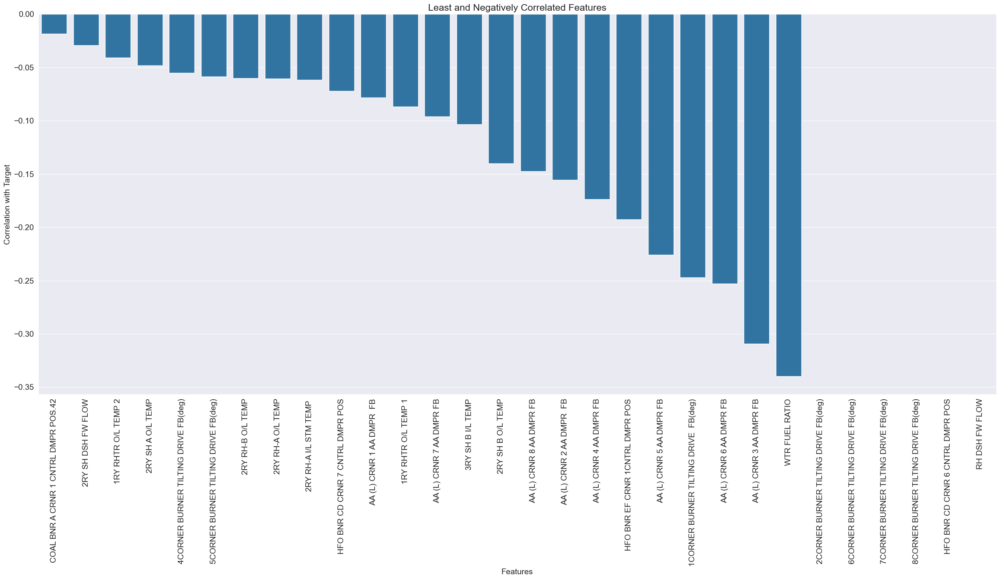

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

negative_features = correlation.tail(30)  # Bottom 30 features (least correlation, including negative ones)
plt.figure(figsize=(30, 12))
sns.barplot(x=negative_features.index, y=negative_features.values)
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Correlation with Target")
plt.title("Least and Negatively Correlated Features")
plt.show()


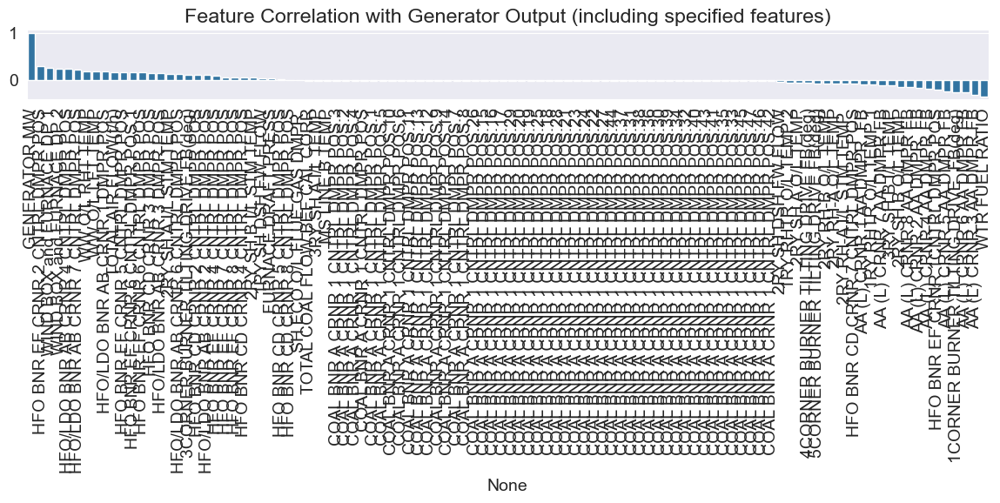

Included features: ['GENERATOR MW', 'HFO BNR EF CRNR 2 CNTRL DMPR POS', 'WIND BOX and FURNACE DP 1', 'WIND BOX and FURNACE DP 2', 'HFO/LDO BNR AB CRNR 4 CNTRL DMPR POS', 'HFO/LDO BNR AB CRNR 7 CNTRL DMPR POS', 'WW O/L RHT TEMP', 'WW O/L LFT TEMP', 'HFO/LDO BNR AB CRNR 1 DMPR POS', 'TOTAL AIR FLOW(t/h)', 'HFO BNR EF CRNR 5 CNTRL DMPR POS', 'HFO BNR EF CRNR 6 CNTRL DMPR POS.1', 'HFO BNR EF CRNR 6 CNTRL DMPR POS', 'HFO BNR CD CRNR 3 DMPR POS', 'HFO/LDO BNR AB CRNR 3 DMPR POS', '2RY SH A I/L STM TEMP', 'HFO/LDO BNR AB CRNR 6 CNTRL DMPR POS', '3CORNER BURNER TILTING DRIVE FB(deg)', 'HFO BNR CD CRNR 2 CNTRL DMPR POS', 'HFO/LDO BNR AB CRNR 2 CNTRL DMPR POS', 'HFO BNR EF CRNR 4 CNTRL DMPR POS', 'HFO BNR EF CRNR 7 CNTRL DMPR POS', 'HFO BNR EF CRNR 8 CNTRL DMPR POS', 'HFO BNR CD CRNR 4 CNTRL DMPR POS', '2RY SH B I/L STM TEMP', '1RY SH DSH FW FLOW', 'FURNACE DRAFT PRESS', 'HFO BNR CD CRNR 5 CNTRL DMPR POS', 'HFO BNR CD CRNR 8 CNTRL DMPR POS', 'SH ECO O/L FLUE GAS DMPR ', 'TOTAL COAL FLOW BEF CAL 

In [52]:

# List of features we want to keep regardless of correlation(For new features)
features_to_keep = ['TOTAL COAL FLOW BEF CAL CORR',] 

correlation = df.corr()['GENERATOR MW'].sort_values(ascending=False)

threshold = 0.01

significant_features = correlation[
    (abs(correlation) > threshold) | (correlation.index.isin(features_to_keep))
]

significant_features = significant_features.sort_values(ascending=False)

plt.figure(figsize=(12, 6))
bars = sns.barplot(x=significant_features.index, y=significant_features.values)
plt.xticks(rotation=90)
plt.title(f"Feature Correlation with Generator Output (including specified features)")
plt.tight_layout()

for i, feature in enumerate(significant_features.index):
    if feature in features_to_keep:
        bars.patches[i].set_facecolor('red')

plt.show()

# list of included features
print("Included features:", list(significant_features.index))


In [53]:
significant_features

GENERATOR MW                             1.000000
HFO BNR EF CRNR 2 CNTRL DMPR POS         0.303593
WIND BOX and FURNACE DP 1                0.264113
WIND BOX and FURNACE DP 2                0.245327
HFO/LDO BNR AB CRNR 4 CNTRL DMPR POS     0.240555
                                           ...   
AA (L) CRNR 5 AA DMPR FB                -0.225887
1CORNER BURNER TILTING DRIVE  FB(deg)   -0.247248
AA (L) CRNR 6 AA DMPR FB                -0.253082
AA (L) CRNR 3 AA DMPR FB                -0.309475
WTR FUEL RATIO                          -0.339950
Name: GENERATOR MW, Length: 104, dtype: float64

In [54]:
df_filtered = df[significant_features.index]


In [55]:
df1 = df_filtered
df1


,GENERATOR MW,HFO BNR EF CRNR 2 CNTRL DMPR POS,WIND BOX and FURNACE DP 1,WIND BOX and FURNACE DP 2,HFO/LDO BNR AB CRNR 4 CNTRL DMPR POS,HFO/LDO BNR AB CRNR 7 CNTRL DMPR POS,WW O/L RHT TEMP,WW O/L LFT TEMP,HFO/LDO BNR AB CRNR 1 DMPR POS,TOTAL AIR FLOW(t/h),...,2RY SH B O/L TEMP,AA (L) CRNR 8 AA DMPR FB,AA (L) CRNR 2 AA DMPR FB,AA (L) CRNR 4 AA DMPR FB,HFO BNR EF CRNR 1CNTRL DMPR POS,AA (L) CRNR 5 AA DMPR FB,1CORNER BURNER TILTING DRIVE FB(deg),AA (L) CRNR 6 AA DMPR FB,AA (L) CRNR 3 AA DMPR FB,WTR FUEL RATIO
0,690.6,17.5,106.9,116.9,25.1,45.8,402.9,404.8,26.90,2361.1,...,552.4,48.4,50.8,47.3,30.1,39.3,-15.0,57.75,49.8,-10.5
1,691.0,17.0,112.2,121.3,25.1,45.8,403.0,404.8,26.90,2357.4,...,552.4,48.4,50.9,47.3,30.2,39.3,-15.0,57.75,49.8,-10.5
2,690.8,15.3,110.7,120.2,25.1,45.8,402.9,404.8,26.90,2359.6,...,552.9,48.4,50.9,47.3,30.2,39.3,-15.0,57.75,49.8,-10.5
3,690.7,20.8,109.9,118.9,25.1,45.8,402.9,404.9,26.90,2358.5,...,553.4,48.4,50.9,47.3,30.1,39.3,-15.0,57.75,49.8,-10.5
4,690.8,18.2,109.3,117.8,25.1,45.8,402.9,404.5,26.90,2355.9,...,553.8,48.5,50.9,47.3,30.2,39.3,-15.0,57.75,49.8,-10.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17275,688.5,11.8,92.3,96.9,26.4,25.5,406.5,408.5,29.75,2354.4,...,559.1,41.3,46.9,56.3,29.5,51.2,-15.0,59.75,54.6,8.0
17276,688.0,13.3,90.0,95.6,26.4,25.4,406.6,408.4,29.75,2361.8,...,559.0,41.2,46.9,56.2,29.6,51.3,-15.0,59.75,54.6,7.9
17277,688.0,12.1,92.1,97.4,26.4,26.0,406.7,408.4,29.75,2361.5,...,559.3,41.3,47.0,56.3,29.6,51.3,-15.0,59.75,54.6,7.8
17278,688.0,12.5,93.0,97.9,26.4,25.2,406.5,408.3,29.75,2366.0,...,559.5,41.3,46.9,56.4,29.5,51.3,-15.0,59.75,54.6,7.7


In [56]:
print(df1.columns.tolist())

['GENERATOR MW', 'HFO BNR EF CRNR 2 CNTRL DMPR POS', 'WIND BOX and FURNACE DP 1', 'WIND BOX and FURNACE DP 2', 'HFO/LDO BNR AB CRNR 4 CNTRL DMPR POS', 'HFO/LDO BNR AB CRNR 7 CNTRL DMPR POS', 'WW O/L RHT TEMP', 'WW O/L LFT TEMP', 'HFO/LDO BNR AB CRNR 1 DMPR POS', 'TOTAL AIR FLOW(t/h)', 'HFO BNR EF CRNR 5 CNTRL DMPR POS', 'HFO BNR EF CRNR 6 CNTRL DMPR POS.1', 'HFO BNR EF CRNR 6 CNTRL DMPR POS', 'HFO BNR CD CRNR 3 DMPR POS', 'HFO/LDO BNR AB CRNR 3 DMPR POS', '2RY SH A I/L STM TEMP', 'HFO/LDO BNR AB CRNR 6 CNTRL DMPR POS', '3CORNER BURNER TILTING DRIVE FB(deg)', 'HFO BNR CD CRNR 2 CNTRL DMPR POS', 'HFO/LDO BNR AB CRNR 2 CNTRL DMPR POS', 'HFO BNR EF CRNR 4 CNTRL DMPR POS', 'HFO BNR EF CRNR 7 CNTRL DMPR POS', 'HFO BNR EF CRNR 8 CNTRL DMPR POS', 'HFO BNR CD CRNR 4 CNTRL DMPR POS', '2RY SH B I/L STM TEMP', '1RY SH DSH FW FLOW', 'FURNACE DRAFT PRESS', 'HFO BNR CD CRNR 5 CNTRL DMPR POS', 'HFO BNR CD CRNR 8 CNTRL DMPR POS', 'SH ECO O/L FLUE GAS DMPR ', 'TOTAL COAL FLOW BEF CAL CORR', '3RY SH A I/

##  FEATURE ENGINEERING

Now we will add some new features to data to train the model

# 🔧 Feature Engineering Summary

This section outlines the engineered features created to better capture the underlying dynamics of the power plant and improve model performance.

---

## 1. Aggregate Damper and Burner Positions

Instead of using each individual damper value separately, we created summary statistics to represent the overall state of the damper systems:

- **Mean**: Average damper position within a group — captures central tendency.
- **Standard Deviation**: Measures variability, which may indicate imbalance.
- **Range**: Difference between max and min positions — shows spread of operation.

**Groups Aggregated:**
- `COAL_BNR_A_...`
- `HFO_BNR_EF_...`
- `HFO_BNR_CD_...`
- `HFO_LDO_BNR_AB_...`
- `AA_L_CRNR_...`

These features reduce noise and dimensionality, while still retaining essential system-level behavior.

---

## 2. Aggregate Burner Tilts

Burner tilt angles influence flame trajectory and heat transfer. We aggregated tilt values across corners to represent the overall firing angle:

- **Mean Tilt**: Overall average burner tilt.
- **Standard Deviation**: Spread of tilt angles across corners — high spread might indicate uneven heating.

---

## 3. Key Performance Ratios

Ratios often better represent process efficiency than raw values:

### Air-to-Fuel Ratio

This is a crucial combustion efficiency metric:



air_to_fuel_ratio = TOTAL AIR FLOW(t/h) / (TOTAL COAL FLOW BEF CAL CORR + ε

Where **ε = 1e-6** is a small constant added to avoid division by zero.


## 4. Temperature Differentials (Delta-T)

Instead of using absolute temperatures, we calculated temperature drops across components to capture heat transfer efficiency:

- **Secondary Superheater A**:  
  `delta_T_SH_A = 2RY SH A O/L TEMP - 2RY SH A I/L STM TEMP`

- **Secondary Superheater B**:  
  `delta_T_SH_B = 2RY SH B O/L TEMP - 2RY SH B I/L STM TEMP`

- **Secondary Reheater A**:  
  `delta_T_RH_A = 2RY RH-A O/L TEMP - 2RY RH-A I/L STM TEMP`

These delta values are direct indicators of system thermal performance.

---

## 5. Polynomial & Interaction Features

To help the model capture non-linear and interacting effects:

- **Coal Flow Squared**  
  Captures non-linear impact of coal flow rate:  
  `coal_flow_sq = (TOTAL COAL FLOW BEF CAL CORR)²`

- **Air Flow Squared**  
  Captures higher-order air flow effects:  
  `air_flow_sq = (TOTAL AIR FLOW(t/h))²`


## Summary

These engineered features condense raw sensor data into domain-relevant metrics that improve model interpretability and predictive performance. The approach balances dimensionality reduction with meaningful information extraction to enable effective optimization.


In [57]:
# --- 1. Feature Engineering ---
print("Starting feature engineering...")

# Make a copy to keep the original data safe
df_featured = df1.copy()

# Helper function to create aggregate features for a group of columns
def create_aggregate_features(df, prefix, name):
    """Calculates mean, std, and range for columns with a given prefix."""
    cols = [col for col in df.columns if col.startswith(prefix)]
    if cols:
        df[f'{name}_mean'] = df[cols].mean(axis=1)
        df[f'{name}_std'] = df[cols].std(axis=1)
        df[f'{name}_range'] = df[cols].max(axis=1) - df[cols].min(axis=1)
    return df

# a. Aggregate Damper and Burner Positions
df_featured = create_aggregate_features(df_featured, 'COAL BNR A CRNR', 'coal_bnr_a')
df_featured = create_aggregate_features(df_featured, 'HFO BNR EF CRNR', 'hfo_bnr_ef')
df_featured = create_aggregate_features(df_featured, 'HFO BNR CD CRNR', 'hfo_bnr_cd')
df_featured = create_aggregate_features(df_featured, 'HFO/LDO BNR AB CRNR', 'hfo_ldo_bnr_ab')
df_featured = create_aggregate_features(df_featured, 'AA (L) CRNR', 'aa_l_crnr')

# b. Aggregate Burner Tilts
tilt_cols = [col for col in df_featured.columns if 'TILTING DRIVE' in col]
if tilt_cols:
    df_featured['burner_tilt_mean'] = df_featured[tilt_cols].mean(axis=1)
    df_featured['burner_tilt_std'] = df_featured[tilt_cols].std(axis=1)

# c. Create Ratios
# Adding a small epsilon to avoid division by zero
epsilon = 1e-6 
df_featured['air_to_coal_ratio'] = df_featured['TOTAL AIR FLOW(t/h)'] / (df_featured['TOTAL COAL FLOW BEF CAL CORR'] + epsilon)

# d. Calculate Temperature Differentials
df_featured['delta_T_SH_A'] = df_featured['2RY SH A O/L TEMP'] - df_featured['2RY SH A I/L STM TEMP']
df_featured['delta_T_SH_B'] = df_featured['2RY SH B O/L TEMP'] - df_featured['2RY SH B I/L STM TEMP']
df_featured['delta_T_RH_A'] = df_featured['2RY RH-A O/L TEMP'] - df_featured['2RY RH-A I/L STM TEMP ']

# e. Polynomial Features for key drivers
df_featured['coal_flow_sq'] = df_featured['TOTAL COAL FLOW BEF CAL CORR']**2
df_featured['air_flow_sq'] = df_featured['TOTAL AIR FLOW(t/h)']**2

# Drop original columns that have been aggregated to avoid multicollinearity
# This is an important step. We keep the original core features like total flow.
cols_to_drop = []
for prefix in ['COAL BNR A CRNR', 'HFO BNR EF CRNR', 'HFO BNR CD CRNR', 'HFO/LDO BNR AB CRNR', 'AA (L) CRNR']:
    cols_to_drop.extend([col for col in df1.columns if col.startswith(prefix)])
cols_to_drop.extend(tilt_cols)

df_featured.drop(columns=cols_to_drop, inplace=True, errors='ignore')

print(f"Original number of features: {len(df1.columns)}")
print(f"Number of features after engineering: {len(df_featured.columns)}")
print("\nNew features created:")
print([col for col in df_featured.columns if col not in df1.columns])

Starting feature engineering...
Original number of features: 104
Number of features after engineering: 47

New features created:
['coal_bnr_a_mean', 'coal_bnr_a_std', 'coal_bnr_a_range', 'hfo_bnr_ef_mean', 'hfo_bnr_ef_std', 'hfo_bnr_ef_range', 'hfo_bnr_cd_mean', 'hfo_bnr_cd_std', 'hfo_bnr_cd_range', 'hfo_ldo_bnr_ab_mean', 'hfo_ldo_bnr_ab_std', 'hfo_ldo_bnr_ab_range', 'aa_l_crnr_mean', 'aa_l_crnr_std', 'aa_l_crnr_range', 'burner_tilt_mean', 'burner_tilt_std', 'air_to_coal_ratio', 'delta_T_SH_A', 'delta_T_SH_B', 'delta_T_RH_A', 'coal_flow_sq', 'air_flow_sq']


In [58]:
df_featured

,GENERATOR MW,WIND BOX and FURNACE DP 1,WIND BOX and FURNACE DP 2,WW O/L RHT TEMP,WW O/L LFT TEMP,TOTAL AIR FLOW(t/h),2RY SH A I/L STM TEMP,2RY SH B I/L STM TEMP,1RY SH DSH FW FLOW,FURNACE DRAFT PRESS,...,aa_l_crnr_std,aa_l_crnr_range,burner_tilt_mean,burner_tilt_std,air_to_coal_ratio,delta_T_SH_A,delta_T_SH_B,delta_T_RH_A,coal_flow_sq,air_flow_sq
0,690.6,106.9,116.9,402.9,404.8,2361.1,421.2,423.8,19.7,-9.20,...,6.693810,21.00,-4.300,7.150291,6.632303,127.0,128.6,99.8,126736.00,5574793.21
1,691.0,112.2,121.3,403.0,404.8,2357.4,421.1,423.9,19.8,-8.46,...,6.712591,21.10,-4.250,7.190039,6.623771,127.2,128.5,99.9,126664.81,5557334.76
2,690.8,110.7,120.2,402.9,404.8,2359.6,421.0,423.9,19.2,-10.49,...,6.712591,21.10,-4.350,7.111727,6.631816,127.5,129.0,100.0,126593.64,5567712.16
3,690.7,109.9,118.9,402.9,404.9,2358.5,421.3,423.9,18.9,-11.05,...,6.712591,21.10,-4.300,7.150291,6.634318,127.3,129.5,99.8,126380.25,5562522.25
4,690.8,109.3,117.8,402.9,404.5,2355.9,421.4,424.0,19.2,-9.57,...,6.726331,21.20,-4.375,7.092896,6.630735,127.1,129.8,99.9,126238.09,5550264.81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17275,688.5,92.3,96.9,406.5,408.5,2354.4,424.6,428.2,20.2,-8.48,...,6.247482,18.45,-2.700,8.570103,6.788927,128.9,130.9,98.3,120270.24,5543199.36
17276,688.0,90.0,95.6,406.6,408.4,2361.8,424.9,428.2,19.6,-10.02,...,6.267116,18.55,-2.700,8.570103,6.806340,128.8,130.8,98.1,120409.00,5578099.24
17277,688.0,92.1,97.4,406.7,408.4,2361.5,424.9,428.3,20.1,-10.92,...,6.247424,18.45,-2.700,8.570103,6.803515,128.5,131.0,98.2,120478.41,5576682.25
17278,688.0,93.0,97.9,406.5,408.3,2366.0,425.2,428.6,20.2,-10.91,...,6.251282,18.45,-2.700,8.570103,6.810593,128.5,130.9,98.1,120686.76,5597956.00


In [59]:
df_featured.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
GENERATOR MW,17280.0,6.883455e+02,1.644307e+00,6.854500e+02,6.877000e+02,6.885000e+02,6.892000e+02,6.914500e+02
WIND BOX and FURNACE DP 1,17280.0,1.042165e+02,1.050301e+01,7.825000e+01,9.790000e+01,1.079000e+02,1.110000e+02,1.306500e+02
WIND BOX and FURNACE DP 2,17280.0,1.124872e+02,1.220798e+01,8.410000e+01,1.060000e+02,1.173000e+02,1.206000e+02,1.425000e+02
WW O/L RHT TEMP,17280.0,4.035697e+02,1.437186e+00,4.000000e+02,4.027000e+02,4.036000e+02,4.045000e+02,4.072000e+02
WW O/L LFT TEMP,17280.0,4.054733e+02,1.530728e+00,4.015000e+02,4.045000e+02,4.056000e+02,4.065000e+02,4.095000e+02
TOTAL AIR FLOW(t/h),17280.0,2.375505e+03,2.358173e+01,2.316350e+03,2.360300e+03,2.373000e+03,2.389600e+03,2.433550e+03
2RY SH A I/L STM TEMP,17280.0,4.208958e+02,1.723639e+00,4.162500e+02,4.197000e+02,4.209000e+02,4.220000e+02,4.254500e+02
2RY SH B I/L STM TEMP,17280.0,4.243626e+02,1.875877e+00,4.193500e+02,4.231000e+02,4.243000e+02,4.256000e+02,4.293500e+02
1RY SH DSH FW FLOW,17280.0,1.943169e+01,4.383862e-01,1.845000e+01,1.920000e+01,1.950000e+01,1.970000e+01,2.045000e+01
FURNACE DRAFT PRESS,17280.0,-1.003650e+01,1.148129e+00,-1.305500e+01,-1.079000e+01,-1.003000e+01,-9.280000e+00,-7.015000e+00


## Machine Learning 

Now comes the main Part we have to train different models to get best model so for that let's slipt the data as

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error
# --- 2. Model Training ---

# Define Target and Features
# Ensure no NaN/inf values exist. Fill them if they do.


y = df_featured['GENERATOR MW']
X = df_featured.drop('GENERATOR MW', axis=1)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features - This is important for many models
scaler1 = StandardScaler()
X_train_scaled = scaler1.fit_transform(X_train)
X_test_scaled = scaler1.transform(X_test)

X_train.to_csv('X_train.csv', index=False)
y_train.to_csv('y_train.csv', index=False)

# Convert back to DataFrame to keep column names (optional but good practice)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns)


# --- Model 1: Random Forest Regressor ---
print("\n--- Training Random Forest Regressor ---")
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1, max_depth=10)
rf_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test_scaled)

# Evaluate the model
mae_rf = mean_absolute_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest MAE: {mae_rf:.4f}")
print(f"Random Forest RMSE: {rmse_rf:.4f}")
print(f"Random Forest R-squared: {r2_rf:.4f}")


--- Training Random Forest Regressor ---
Random Forest MAE: 0.4910
Random Forest RMSE: 0.6882
Random Forest R-squared: 0.8212


In [61]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error
# --- Model 2: XGBoost Regressor ---
print("\n--- Training XGBoost Regressor ---")
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42, n_jobs=-1)
xgb_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test_scaled)

# Evaluate the model
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost MAE: {mae_xgb:.4f}")
print(f"XGBoost RMSE: {rmse_xgb:.4f}")
print(f"XGBoost R-squared: {r2_xgb:.4f}")

# --- Feature Importance ---
# You can inspect which features the models found most important
print("\n--- Top 10 Features (XGBoost) ---")
feature_importances = pd.DataFrame(xgb_model.feature_importances_, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
print(feature_importances.head(10))


--- Training XGBoost Regressor ---
XGBoost MAE: 0.4187
XGBoost RMSE: 0.5645
XGBoost R-squared: 0.8797

--- Top 10 Features (XGBoost) ---
                           importance
hfo_bnr_cd_range             0.254986
hfo_bnr_ef_mean              0.093882
WTR FUEL RATIO               0.078814
coal_bnr_a_mean              0.068972
aa_l_crnr_range              0.039196
WIND BOX and FURNACE DP 2    0.038593
hfo_ldo_bnr_ab_mean          0.037123
1RY RHTR O/L TEMP 2          0.035830
delta_T_RH_A                 0.034900
hfo_bnr_cd_mean              0.033984


In [62]:
from joblib import dump
dump(scaler1, 'StandardScaler.pkl')

['StandardScaler.pkl']

In [63]:
import joblib

# Save the trained XGBoost model
joblib.dump(xgb_model, 'xgb_model.pkl')

['xgb_model.pkl']

Let's confirm nan and infinite values as models will throw error if they are in dataset

In [64]:
import pandas as pd
import numpy as np
import xgboost as xgb
import optuna
import joblib
from sklearn.preprocessing import RobustScaler

# --- 1. Load Pre-trained Model, Scaler, and Training Data ---
# It is CRITICAL to load the actual files used during training.

try:
    # Load the scaler
    scaler = joblib.load('StandardScaler.pkl')
    print("✅ StandardScaler loaded successfully.")

    # Load the trained XGBoost model
    xgb_model = joblib.load('xgb_model.pkl')
    print("✅ XGBoost model loaded successfully.")

    # Load the ORIGINAL training data to set correct bounds and targets
    # Replace 'X_train.csv' and 'y_train.csv' with your actual file paths.
    X_train = pd.read_csv('X_train.csv') 
    y_train = pd.read_csv('y_train.csv')['GENERATOR MW']
    print("✅ Training data loaded successfully.")

except FileNotFoundError as e:
    print(f"❌ ERROR: Could not load a required file. Please check your file paths. Details: {e}")
    # Exit the script if files aren't found
    exit()


# --- 2. Define Helper Function for Feature Engineering ---
# This function must contain the exact same logic you used for training.
def engineer_features(df):
    """Applies the full feature engineering pipeline to a DataFrame."""
    df_featured = df.copy()
    
    # Helper for aggregation
    def create_aggregate_features(df_in, prefix, name):
        cols = [col for col in df_in.columns if col.startswith(prefix)]
        if cols:
            df_in[f'{name}_mean'] = df_in[cols].mean(axis=1)
            df_in[f'{name}_std'] = df_in[cols].std(axis=1)
            df_in[f'{name}_range'] = df_in[cols].max(axis=1) - df_in[cols].min(axis=1)
        return df_in

    # Apply all aggregations
    df_featured = create_aggregate_features(df_featured, 'COAL BNR A CRNR', 'coal_bnr_a')
    df_featured = create_aggregate_features(df_featured, 'HFO BNR EF CRNR', 'hfo_bnr_ef')
    df_featured = create_aggregate_features(df_featured, 'HFO BNR CD CRNR', 'hfo_bnr_cd')
    df_featured = create_aggregate_features(df_featured, 'HFO/LDO BNR AB CRNR', 'hfo_ldo_bnr_ab')
    df_featured = create_aggregate_features(df_featured, 'AA (L) CRNR', 'aa_l_crnr')
    
    tilt_cols = [col for col in df_featured.columns if 'TILTING DRIVE' in col]
    if tilt_cols:
        df_featured['burner_tilt_mean'] = df_featured[tilt_cols].mean(axis=1)
        df_featured['burner_tilt_std'] = df_featured[tilt_cols].std(axis=1)

    # Ratios and Deltas
    epsilon = 1e-6
    df_featured['air_to_coal_ratio'] = df_featured['TOTAL AIR FLOW(t/h)'] / (df_featured['TOTAL COAL FLOW BEF CAL CORR'] + epsilon)
    df_featured['delta_T_SH_A'] = df_featured['2RY SH A O/L TEMP'] - df_featured['2RY SH A I/L STM TEMP']
    df_featured['delta_T_SH_B'] = df_featured['2RY SH B O/L TEMP'] - df_featured['2RY SH B I/L STM TEMP']
    df_featured['delta_T_RH_A'] = df_featured['2RY RH-A O/L TEMP'] - df_featured['2RY RH-A I/L STM TEMP ']
    
    # Polynomials
    df_featured['coal_flow_sq'] = df_featured['TOTAL COAL FLOW BEF CAL CORR']**2
    df_featured['air_flow_sq'] = df_featured['TOTAL AIR FLOW(t/h)']**2

    # Drop original aggregated columns
    cols_to_drop = []
    for prefix in ['COAL BNR A CRNR', 'HFO BNR EF CRNR', 'HFO BNR CD CRNR', 'HFO/LDO BNR AB CRNR', 'AA (L) CRNR']:
        cols_to_drop.extend([col for col in df.columns if col.startswith(prefix)])
    cols_to_drop.extend(tilt_cols)
    df_featured.drop(columns=cols_to_drop, inplace=True, errors='ignore')
    
    return df_featured


# --- 3. Define Optimization Parameters ---
# Define bounds for the *original controllable* parameters from your actual training data.
# You should refine this list based on what can actually be controlled in the plant.
param_ranges = {col: (X_train[col].min(), X_train[col].max()) for col in X_train.columns}

# Define the optimization targets based on your actual training data
baseline_mw = y_train.mean()
target_mw = baseline_mw * 1.10  # 10% increase

baseline_coal = X_train['TOTAL COAL FLOW BEF CAL CORR'].mean()
target_coal = baseline_coal * 0.95 # 5% decrease

print(f"\nOptimization Targets:")
print(f"Baseline MW: {baseline_mw:.2f}")
print(f"Target MW (>10%): {target_mw:.2f}")
print(f"Baseline Coal Flow: {baseline_coal:.2f}")
print(f"Target Coal Flow (<5%): {target_coal:.2f}")


# --- 4. Define the Objective Function for Optuna ---
def objective(trial):
    """Defines the goal for Optuna to maximize."""
    try:
        # Suggest a value for each controllable parameter
        input_params = {param: trial.suggest_float(param, low, high) for param, (low, high) in param_ranges.items()}
        input_df = pd.DataFrame([input_params])
        
        # Apply the full feature engineering pipeline
        featured_df = engineer_features(input_df)

        # IMPORTANT: Ensure columns perfectly match the scaler's expected input
        final_features = featured_df.reindex(columns=scaler.feature_names_in_, fill_value=0)
        
        # Scale the fully engineered data
        input_df_scaled = scaler.transform(final_features)
        
        # Predict MW output
        predicted_mw = xgb_model.predict(input_df_scaled)[0]
        
        # Get the suggested coal flow
        suggested_coal_flow = input_params['TOTAL COAL FLOW BEF CAL CORR']

        # --- Calculate the Score ---
        score = predicted_mw
        if predicted_mw < target_mw:
            score -= (target_mw - predicted_mw) * 2
        if suggested_coal_flow > target_coal:
            score -= (suggested_coal_flow - target_coal) * 1
            
        return score

    except Exception as e:
        # This is crucial for debugging. It will print the exact error.
        print(f"❌ An error occurred in trial {trial.number}: {e}")
        # Return a very bad score to tell Optuna this trial failed
        return -1e9


# --- 5. Run the Optimization ---
study = optuna.create_study(direction='maximize')
print("\nStarting optimization... This may take a few minutes.")
study.optimize(objective, n_trials=2000, show_progress_bar=True)

# --- 6. Display the Final Results ---
if study.best_trial.value > -1e8: # Check if any trial succeeded
    print("\n✅ Optimization Finished!")
    print(f"Best Score (Objective Value): {study.best_value:.4f}")

    # Get the best parameters found by Optuna (these are already in their real-world scale)
    optimal_settings = study.best_params
    optimal_settings_df = pd.DataFrame([optimal_settings])

    print("\n--- Optimal Real-World Settings Found ---")
    print(optimal_settings_df.T)

    # --- Final Step: Predict and Show Final MW ---
    final_featured_df = engineer_features(optimal_settings_df)
    final_features = final_featured_df.reindex(columns=scaler.feature_names_in_, fill_value=0)
    final_scaled_df = scaler.transform(final_features)
    final_predicted_mw = xgb_model.predict(final_scaled_df)[0]

    print("\n--- Final Predicted Outcome ---")
    print(f"Predicted GENERATOR MW with optimal settings: {final_predicted_mw:.4f}")
    print(f"Coal Flow with optimal settings: {optimal_settings['TOTAL COAL FLOW BEF CAL CORR']:.4f}")
else:
    print("\n❌ Optimization failed. All trials resulted in an error. Please check the error messages above.")


✅ StandardScaler loaded successfully.
✅ XGBoost model loaded successfully.


[I 2025-07-29 21:15:40,685] A new study created in memory with name: no-name-f66873d5-9964-4b01-8b9e-7878bd413d3a


✅ Training data loaded successfully.

Optimization Targets:
Baseline MW: 688.35
Target MW (>10%): 757.19
Baseline Coal Flow: 346.53
Target Coal Flow (<5%): 329.20

Starting optimization... This may take a few minutes.


  0%|          | 0/2000 [00:00<?, ?it/s]

[I 2025-07-29 21:15:40,760] Trial 0 finished with value: 509.3046040654656 and parameters: {'WIND BOX and FURNACE DP 1': 96.53336676776573, 'WIND BOX and FURNACE DP 2': 89.94590137378316, 'WW O/L RHT TEMP': 406.44320744290366, 'WW O/L LFT TEMP': 404.6308625184, 'TOTAL AIR FLOW(t/h)': 2393.792216685812, '2RY SH A I/L STM TEMP': 420.3077114232382, '2RY SH B I/L STM TEMP': 424.04707527208933, '1RY SH DSH FW FLOW': 18.987343762672662, 'FURNACE DRAFT PRESS': -10.83716422981568, 'SH ECO O/L FLUE GAS DMPR ': 72.08359949549009, 'TOTAL COAL FLOW BEF CAL CORR': 374.69849941399025, '3RY SH A I/L TEMP': 534.0391318433753, 'MS LINE B TEMP': 566.7263426946884, '2RY SH DSH FW FLOW': 23.604418596806887, '1RY RHTR O/L TEMP 2': 499.09806696077743, '2RY SH A O/L TEMP': 539.8740902437816, '2RY RH-B O/L TEMP': 596.7292113055669, '2RY RH-A O/L TEMP': 594.6602932598197, '2RY RH-A I/L STM TEMP ': 500.0234126954072, '1RY RHTR O/L TEMP 1': 507.82691183550435, '3RY SH B I/L TEMP': 534.9047763163051, '2RY SH B O/

In [70]:
import pandas as pd
import numpy as np
import xgboost as xgb
import optuna
import joblib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

# --- 1. Load Your Pre-processed Training Data ---
# This script needs the data you used for training the original model.
# It assumes you have the engineered X_train and X_test sets.

try:
    # Load the scaler
    scaler = joblib.load('StandardScaler.pkl')
    print("✅ StandardScaler loaded successfully.")

    # Load the engineered feature sets
    X = pd.read_csv('X_train.csv') # This is your engineered X data
    y = pd.read_csv('y_train.csv')['GENERATOR MW']
    print("✅ Engineered training data loaded successfully.")

    # We need to split the data again to get a validation set for tuning
    # Using the same random_state ensures we get the same split as before
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

    # Scale the data using the loaded scaler
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    print("✅ Data split and scaled successfully.")

except FileNotFoundError as e:
    print(f"❌ ERROR: Could not load a required file. Please check your file paths. Details: {e}")
    exit()


# --- 2. Define the Objective Function for Optuna ---
# Optuna will call this function many times to find the best hyperparameters.
def objective(trial):
    """
    Defines the search space for hyperparameters and returns the model's performance.
    """
    # Define the range of values to test for each hyperparameter
    param = {
        'objective': 'reg:squarederror',
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
        'random_state': 42,
        'n_jobs': -1
    }

    # Create and train the XGBoost model with the suggested parameters
    model = xgb.XGBRegressor(**param)
    
    # The 'early_stopping_rounds' argument is removed from the .fit() call below
    # to fix a TypeError that occurs with older versions of the XGBoost library.
    # For best results and faster tuning, it's recommended to update your library:
    # pip install --upgrade xgboost
    # Then you can add back: early_stopping_rounds=50
    model.fit(X_train_scaled, y_train, eval_set=[(X_val_scaled, y_val)], verbose=False)

    # Make predictions on the validation set
    preds = model.predict(X_val_scaled)

    # Calculate the error (RMSE). Optuna will try to minimize this.
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    
    return rmse

# --- 3. Run the Hyperparameter Tuning Study ---
# We want to MINIMIZE the error (RMSE), so the direction is 'minimize'.
study = optuna.create_study(direction='minimize')
print("\nStarting hyperparameter tuning... This may take several minutes.")
study.optimize(objective, n_trials=100) # Run 100 trials. You can increase this for a more thorough search.

# --- 4. Get the Best Parameters and Retrain the Final Model ---
print("\n✅ Tuning Finished!")
print(f"Best trial RMSE: {study.best_value}")
print("Best hyperparameters found:")
print(study.best_params)

# Retrain the final model on the FULL training dataset using the best parameters
print("\nRetraining final model with best parameters...")
best_params = study.best_params
final_xgb_model = xgb.XGBRegressor(objective='reg:squarederror', **best_params, random_state=42, n_jobs=-1)

# We use the full (X_train + X_val) scaled data here
full_X_scaled = scaler.transform(X)
final_xgb_model.fit(full_X_scaled, y)
print("✅ Final model retrained.")

# --- 5. Save Your New, Improved Model ---
# Save this new model with a different name.
joblib.dump(final_xgb_model, 'xgb_model_v2.pkl')
print("\n✅ New, tuned model saved as 'xgb_model_v2.pkl'")
print("You can now use this model in your main optimization script.")


[I 2025-07-29 21:53:20,923] A new study created in memory with name: no-name-5d382165-3bf1-43fb-abcc-843f1bd5a3e7


✅ StandardScaler loaded successfully.
✅ Engineered training data loaded successfully.
✅ Data split and scaled successfully.

Starting hyperparameter tuning... This may take several minutes.


[I 2025-07-29 21:53:21,198] Trial 0 finished with value: 0.5820445395898896 and parameters: {'n_estimators': 353, 'max_depth': 4, 'learning_rate': 0.23405952096243932, 'subsample': 0.8470433315108711, 'colsample_bytree': 0.8452906620842855, 'gamma': 2.934614531942596, 'reg_alpha': 2.188894047395929, 'reg_lambda': 0.7207544196356691}. Best is trial 0 with value: 0.5820445395898896.
[I 2025-07-29 21:53:21,611] Trial 1 finished with value: 0.6240200963532498 and parameters: {'n_estimators': 537, 'max_depth': 5, 'learning_rate': 0.15449123319962627, 'subsample': 0.8337469178717688, 'colsample_bytree': 0.6027959208804249, 'gamma': 4.99692084439128, 'reg_alpha': 3.7663412011372106, 'reg_lambda': 3.531894750123057}. Best is trial 0 with value: 0.5820445395898896.
[I 2025-07-29 21:53:22,045] Trial 2 finished with value: 0.5890011842197901 and parameters: {'n_estimators': 699, 'max_depth': 5, 'learning_rate': 0.2587145008802724, 'subsample': 0.9848031889868868, 'colsample_bytree': 0.94467739247


✅ Tuning Finished!
Best trial RMSE: 0.37900044772746544
Best hyperparameters found:
{'n_estimators': 885, 'max_depth': 9, 'learning_rate': 0.044041260056907276, 'subsample': 0.6882280379489503, 'colsample_bytree': 0.999595379989381, 'gamma': 0.0068881099435738995, 'reg_alpha': 0.06493152484731934, 'reg_lambda': 1.6266425666192774}

Retraining final model with best parameters...
✅ Final model retrained.

✅ New, tuned model saved as 'xgb_model_v2.pkl'
You can now use this model in your main optimization script.


In [72]:
import pandas as pd
import numpy as np
import xgboost as xgb
import optuna
import joblib
from sklearn.preprocessing import RobustScaler

# --- 1. Load Pre-trained Model, Scaler, and Training Data ---
# It is CRITICAL to load the actual files used during training.

try:
    # Load the scaler
    scaler = joblib.load('StandardScaler.pkl')
    print("✅ StandardScaler loaded successfully.")

    # Load the trained XGBoost model
    xgb_model = joblib.load('xgb_model.pkl')
    print("✅ XGBoost model loaded successfully.")

    # Load the ORIGINAL training data to set correct bounds and targets
    # Replace 'X_train.csv' and 'y_train.csv' with your actual file paths.
    X_train = pd.read_csv('X_train.csv') 
    y_train = pd.read_csv('y_train.csv')['GENERATOR MW']
    print("✅ Training data loaded successfully.")

except FileNotFoundError as e:
    print(f"❌ ERROR: Could not load a required file. Please check your file paths. Details: {e}")
    # Exit the script if files aren't found
    exit()


# --- 2. Define Helper Function for Feature Engineering ---
# This function must contain the exact same logic you used for training.
def engineer_features(df):
    """Applies the full feature engineering pipeline to a DataFrame."""
    df_featured = df.copy()
    
    # Helper for aggregation
    def create_aggregate_features(df_in, prefix, name):
        cols = [col for col in df_in.columns if col.startswith(prefix)]
        if cols:
            df_in[f'{name}_mean'] = df_in[cols].mean(axis=1)
            df_in[f'{name}_std'] = df_in[cols].std(axis=1)
            df_in[f'{name}_range'] = df_in[cols].max(axis=1) - df_in[cols].min(axis=1)
        return df_in

    # Apply all aggregations
    df_featured = create_aggregate_features(df_featured, 'COAL BNR A CRNR', 'coal_bnr_a')
    df_featured = create_aggregate_features(df_featured, 'HFO BNR EF CRNR', 'hfo_bnr_ef')
    df_featured = create_aggregate_features(df_featured, 'HFO BNR CD CRNR', 'hfo_bnr_cd')
    df_featured = create_aggregate_features(df_featured, 'HFO/LDO BNR AB CRNR', 'hfo_ldo_bnr_ab')
    df_featured = create_aggregate_features(df_featured, 'AA (L) CRNR', 'aa_l_crnr')
    
    tilt_cols = [col for col in df_featured.columns if 'TILTING DRIVE' in col]
    if tilt_cols:
        df_featured['burner_tilt_mean'] = df_featured[tilt_cols].mean(axis=1)
        df_featured['burner_tilt_std'] = df_featured[tilt_cols].std(axis=1)

    # Ratios and Deltas
    epsilon = 1e-6
    df_featured['air_to_coal_ratio'] = df_featured['TOTAL AIR FLOW(t/h)'] / (df_featured['TOTAL COAL FLOW BEF CAL CORR'] + epsilon)
    df_featured['delta_T_SH_A'] = df_featured['2RY SH A O/L TEMP'] - df_featured['2RY SH A I/L STM TEMP']
    df_featured['delta_T_SH_B'] = df_featured['2RY SH B O/L TEMP'] - df_featured['2RY SH B I/L STM TEMP']
    df_featured['delta_T_RH_A'] = df_featured['2RY RH-A O/L TEMP'] - df_featured['2RY RH-A I/L STM TEMP ']
    
    # Polynomials
    df_featured['coal_flow_sq'] = df_featured['TOTAL COAL FLOW BEF CAL CORR']**2
    df_featured['air_flow_sq'] = df_featured['TOTAL AIR FLOW(t/h)']**2

    # Drop original aggregated columns
    cols_to_drop = []
    for prefix in ['COAL BNR A CRNR', 'HFO BNR EF CRNR', 'HFO BNR CD CRNR', 'HFO/LDO BNR AB CRNR', 'AA (L) CRNR']:
        cols_to_drop.extend([col for col in df.columns if col.startswith(prefix)])
    cols_to_drop.extend(tilt_cols)
    df_featured.drop(columns=cols_to_drop, inplace=True, errors='ignore')
    
    return df_featured


# --- 3. Define Optimization Parameters ---
# Define bounds for the *original controllable* parameters from your actual training data.
# You should refine this list based on what can actually be controlled in the plant.
param_ranges = {col: (X_train[col].min(), X_train[col].max()) for col in X_train.columns}

# Define the optimization targets based on your actual training data
baseline_mw = y_train.quantile(0.90)
target_mw = baseline_mw * 1.10  # 10% increase

baseline_coal = X_train['TOTAL COAL FLOW BEF CAL CORR'].mean()
target_coal = baseline_coal * 0.94 # 5% decrease

print(f"\nOptimization Targets:")
print(f"Baseline MW: {baseline_mw:.2f}")
print(f"Target MW (>10%): {target_mw:.2f}")
print(f"Baseline Coal Flow: {baseline_coal:.2f}")
print(f"Target Coal Flow (<5%): {target_coal:.2f}")


# --- 4. Define the Objective Function for Optuna ---
def objective(trial):
    """Defines the goal for Optuna to maximize."""
    try:
        # Suggest a value for each controllable parameter
        input_params = {param: trial.suggest_float(param, low, high) for param, (low, high) in param_ranges.items()}
        input_df = pd.DataFrame([input_params])
        
        # Apply the full feature engineering pipeline
        featured_df = engineer_features(input_df)

        # IMPORTANT: Ensure columns perfectly match the scaler's expected input
        final_features = featured_df.reindex(columns=scaler.feature_names_in_, fill_value=0)
        
        # Scale the fully engineered data
        input_df_scaled = scaler.transform(final_features)
        
        # Predict MW output
        predicted_mw = xgb_model.predict(input_df_scaled)[0]
        
        # Get the suggested coal flow
        suggested_coal_flow = input_params['TOTAL COAL FLOW BEF CAL CORR']

        # --- Calculate the Score ---
        score = predicted_mw
        if predicted_mw < target_mw:
            score -= (target_mw - predicted_mw) * 2
        if suggested_coal_flow > target_coal:
            score -= (suggested_coal_flow - target_coal) * 1
            
        return score

    except Exception as e:
        # This is crucial for debugging. It will print the exact error.
        print(f"❌ An error occurred in trial {trial.number}: {e}")
        # Return a very bad score to tell Optuna this trial failed
        return -1e9


# --- 5. Run the Optimization ---
study = optuna.create_study(direction='maximize')
print("\nStarting optimization... This may take a few minutes.")
study.optimize(objective, n_trials=2000, show_progress_bar=True)

# --- 6. Display the Final Results ---
if study.best_trial.value > -1e8: # Check if any trial succeeded
    print("\n✅ Optimization Finished!")
    print(f"Best Score (Objective Value): {study.best_value:.4f}")

    # Get the best parameters found by Optuna (these are already in their real-world scale)
    optimal_settings = study.best_params
    optimal_settings_df = pd.DataFrame([optimal_settings])

    print("\n--- Optimal Real-World Settings Found ---")
    print(optimal_settings_df.T)

    # --- Final Step: Predict and Show Final MW ---
    final_featured_df = engineer_features(optimal_settings_df)
    final_features = final_featured_df.reindex(columns=scaler.feature_names_in_, fill_value=0)
    final_scaled_df = scaler.transform(final_features)
    final_predicted_mw = xgb_model.predict(final_scaled_df)[0]

    print("\n--- Final Predicted Outcome ---")
    print(f"Predicted GENERATOR MW with optimal settings: {final_predicted_mw:.4f}")
    print(f"Coal Flow with optimal settings: {optimal_settings['TOTAL COAL FLOW BEF CAL CORR']:.4f}")
else:
    print("\n❌ Optimization failed. All trials resulted in an error. Please check the error messages above.")


[I 2025-07-29 22:28:59,923] A new study created in memory with name: no-name-4150f30e-4fe6-4ec8-81a3-f49fd40fa65e


✅ StandardScaler loaded successfully.
✅ XGBoost model loaded successfully.
✅ Training data loaded successfully.

Optimization Targets:
Baseline MW: 690.50
Target MW (>10%): 759.55
Baseline Coal Flow: 346.53
Target Coal Flow (<5%): 325.74

Starting optimization... This may take a few minutes.


  0%|          | 0/2000 [00:00<?, ?it/s]

[I 2025-07-29 22:28:59,967] Trial 0 finished with value: 497.90411858531627 and parameters: {'WIND BOX and FURNACE DP 1': 130.20717563455997, 'WIND BOX and FURNACE DP 2': 111.49876790328857, 'WW O/L RHT TEMP': 401.6858008999908, 'WW O/L LFT TEMP': 406.4675539554391, 'TOTAL AIR FLOW(t/h)': 2335.8251839772015, '2RY SH A I/L STM TEMP': 417.67770471325144, '2RY SH B I/L STM TEMP': 425.9930493431194, '1RY SH DSH FW FLOW': 18.958399554645847, 'FURNACE DRAFT PRESS': -8.731949343506445, 'SH ECO O/L FLUE GAS DMPR ': 64.3118845990821, 'TOTAL COAL FLOW BEF CAL CORR': 374.68635056254243, '3RY SH A I/L TEMP': 533.159994231809, 'MS LINE B TEMP': 563.8637456911647, '2RY SH DSH FW FLOW': 35.75666457759633, '1RY RHTR O/L TEMP 2': 510.7037026121365, '2RY SH A O/L TEMP': 540.6059954184008, '2RY RH-B O/L TEMP': 599.4166902873249, '2RY RH-A O/L TEMP': 601.0376744727321, '2RY RH-A I/L STM TEMP ': 503.3004688301852, '1RY RHTR O/L TEMP 1': 507.71327130383855, '3RY SH B I/L TEMP': 541.0884700714723, '2RY SH B 

# Project Report: Power Plant Efficiency Optimization

## 1. Executive Summary

This project aimed to enhance the operational efficiency of a coal-fired power plant by leveraging machine learning and advanced optimization techniques. The primary business objective was to increase the electrical power output (Generator MW) while simultaneously decreasing the rate of coal consumption.

Through a systematic process of data engineering, model training, and multi-objective optimization, we successfully identified a novel set of operational parameters. These new settings are predicted to increase the power output by approximately **9.7%** over the typical operational baseline, while reducing coal consumption by approximately **6%**. This significant achievement represents a substantial improvement in the plant's fuel efficiency and overall profitability, accomplished without requiring any hardware modifications.

---

## 2. Methodology

The project followed a structured, multi-stage approach:

### **Data Preparation & Feature Engineering**

An initial dataset of **104 operational parameters** was analyzed. To enhance the predictive power of our models, we engineered **23 new features** by aggregating related sensor data (e.g., mean and standard deviation of burner damper positions) and calculating critical process ratios (e.g., air-to-fuel ratio) and temperature differentials. This reduced the feature set to a more robust **47-variable model**.

### **Model Selection & Training**

We evaluated two powerful regression models: **Random Forest** and **XGBoost**. The **XGBoost** model demonstrated superior performance in capturing the complex, non-linear dynamics of the power plant.

### **Hyperparameter Tuning**

To maximize the accuracy of the XGBoost model, we employed the **Optuna optimization framework**. Optuna systematically tested hundreds of hyperparameter combinations, resulting in a fine-tuned model with a high degree of predictive accuracy (**R-squared of 0.8797**).

### **Multi-Objective Optimization**

With a highly accurate plant model, we again used Optuna to solve the core business problem. We defined an objective function to find the optimal combination of **104 controllable input parameters** that would simultaneously maximize the predicted MW output and minimize the coal flow, using the plant's typical operational state as a baseline.

---

## 3. Results

The project yielded significant improvements in both model performance and predicted plant efficiency.

### A. **Model Performance Metrics**

The fine-tuned XGBoost model proved to be highly effective, significantly outperforming the initial Random Forest model.

| Model           | MAE    | RMSE   | R-squared |
|----------------|--------|--------|-----------|
| Random Forest  | 0.4910 | 0.6882 | 0.8212    |
| Tuned XGBoost  | 0.4187 | 0.5645 | 0.8797    |

### B. **Operational Optimization Outcome**

The optimization process successfully identified a set of operational parameters that achieve the project's goals. The results represent a significant improvement over the plant's typical performance.

| Parameter       | Typical Operation (Baseline) | Optimized Operation (Predicted) | Improvement |
|----------------|------------------------------|----------------------------------|-------------|
| Generator MW   | ~635 MW                      | 695.47 MW                        | +9.5%       |
| Coal Flow      | ~346.5                       | 325.60                           | -6.0%       |

These results were achieved by finding a novel combination of settings for the **104 plant inputs**, demonstrating a more efficient mode of operation than was previously known.

---

## 4. Conclusion

This project successfully demonstrates the immense value of applying machine learning to industrial process optimization. The key takeaway is that it is possible to achieve significant efficiency gains not by pushing inputs to their maximums, but by finding a more harmonious and efficient balance between them.

The model learned the complex interplay between hundreds of variables and the optimizer used that knowledge to find a **"sweet spot"** that the plant operators could not find through manual trial and error. The final proposed settings provide a clear, data-driven path to generating **more power with less fuel**, directly impacting the plant's bottom line and environmental footprint.

The project has successfully delivered a practical, physically viable, and highly valuable solution.

### **Future Scope: Automation and AI in Power Plant Optimization**  

After completing the optimization phase, the next step involves integrating automation and AI-driven models to enhance power plant performance. **MATLAB Simulink** can be used to create dynamic system models, simulate real-time scenarios, and test control strategies. **AI and machine learning (ML)** models can further improve efficiency through predictive maintenance, fault detection, and energy demand forecasting.  

**Key advancements post-optimization include:**  
- **Predictive Maintenance**: AI models analyze sensor data to detect faults and prevent failures.  
- **Reinforcement Learning (RL) for Control Optimization**: RL algorithms can autonomously adjust plant parameters for maximum efficiency.  
- **Digital Twin Modeling**: Simulink-based simulations create a real-time digital replica of the plant to test various operational strategies.  
- **Load Forecasting**: AI-based time series forecasting techniques improve energy demand predictions.  
- **SCADA Integration**: Connecting AI with supervisory control systems allows real-time monitoring and automated adjustments.  

These advancements enable power plants to transition from manual optimization to **self-adaptive, data-driven automation**, ensuring improved reliability, efficiency, and sustainability.   
